# Spectral Residual Saliency

Code below implement Spectral Residual Saliency algorithm to generate a saliency map

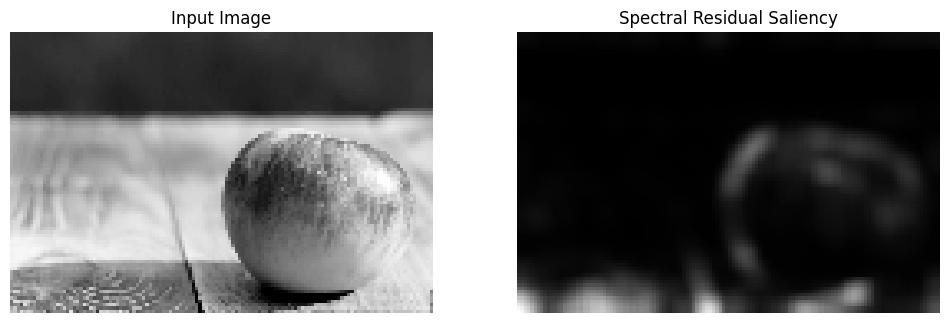

In [ ]:
# Spectral Residual Saliency in Jupyter Notebook

import numpy as np
import cv2
import matplotlib.pyplot as plt

# ------------------------
# Parameters
# ------------------------
WIDTH = 128  # ảnh resize width, ảnh hưởng lớn đến kết quả

# ------------------------
# Load and Resize Image
# ------------------------
img = cv2.imread('images/apple.jpg', 0)  # load grayscale
height, width = img.shape
new_height = int(WIDTH * height / width)
img_resized = cv2.resize(img, (WIDTH, new_height))

# ------------------------
# Compute Fourier Transform
# ------------------------
c = cv2.dft(np.float32(img_resized), flags=cv2.DFT_COMPLEX_OUTPUT)

# Magnitude spectrum
mag = np.sqrt(c[:,:,0]**2 + c[:,:,1]**2)

# Spectral Residual
log_mag = np.log(mag + 1e-8)  # avoid log(0)
avg_log_mag = cv2.boxFilter(log_mag, -1, (3,3))
spectral_residual = np.exp(log_mag - avg_log_mag)

# Apply spectral residual to original complex
c[:,:,0] = c[:,:,0] * spectral_residual / (mag + 1e-8)
c[:,:,1] = c[:,:,1] * spectral_residual / (mag + 1e-8)

# Inverse Fourier Transform
c_inverse = cv2.dft(c, flags=(cv2.DFT_INVERSE | cv2.DFT_SCALE))
saliency_map = c_inverse[:,:,0]**2 + c_inverse[:,:,1]**2

# Gaussian smoothing and normalization
saliency_map = cv2.GaussianBlur(saliency_map, (9,9), 3)
saliency_map = cv2.normalize(saliency_map, None, 0., 1., cv2.NORM_MINMAX)
# ------------------------
# Display
# ------------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_resized, cmap='gray')
plt.title('Input Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(saliency_map, cmap='gray')
plt.title('Spectral Residual Saliency')
plt.axis('off')
plt.show()

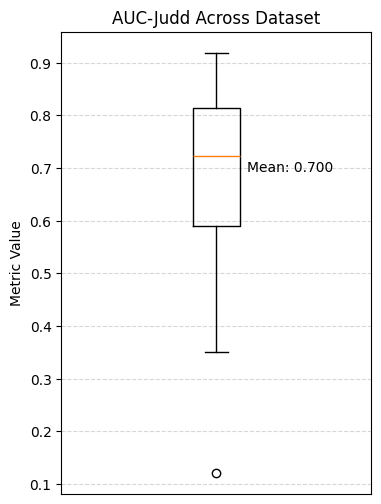

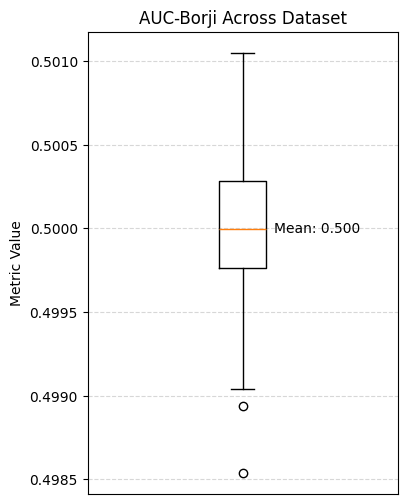

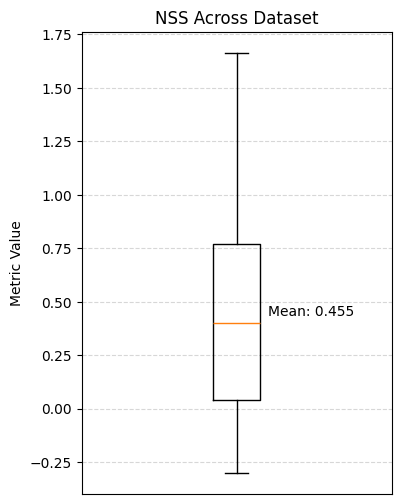

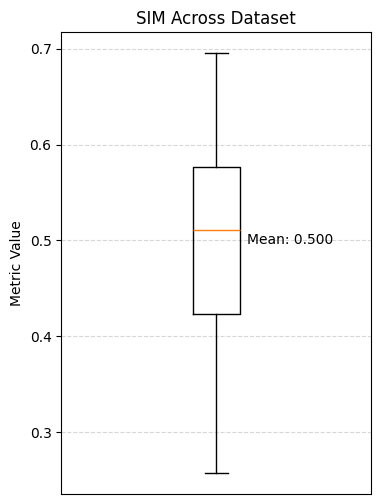

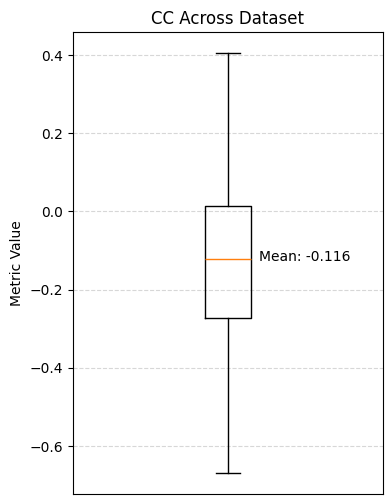

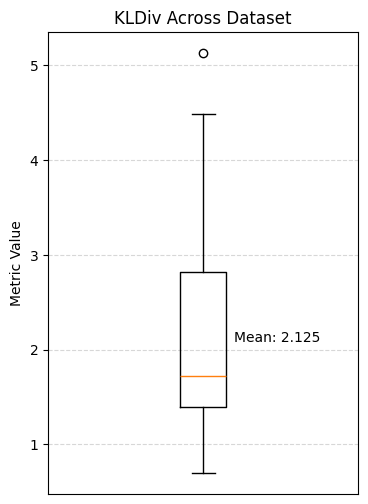

In [19]:
import numpy as np
import cv2
from sklearn.metrics import roc_curve, auc
import os
import matplotlib.pyplot as plt
import numpy as np

# =========================
# Metric functions
# =========================

def auc_judd(saliency, fixation):
    sal = saliency.flatten()
    fix = fixation.flatten()
    fpr, tpr, _ = roc_curve(fix, sal)
    return auc(fpr, tpr)

def auc_borji(saliency, fixation, n_random=100):
    sal = saliency.flatten()
    fix = fixation.flatten()
    N_fix = fix.sum()
    N_total = len(fix)
    aucs = []
    for _ in range(n_random):
        random_fix = np.zeros_like(fix)
        idx = np.random.choice(N_total, int(N_fix), replace=False)
        random_fix[idx] = 1
        fpr, tpr, _ = roc_curve(random_fix, sal)
        aucs.append(auc(fpr, tpr))
    return np.mean(aucs)

def nss(saliency, fixation):
    S = (saliency - saliency.mean()) / (saliency.std() + 1e-8)
    return S[fixation==1].mean()

def sim(saliency, gt):
    sal = saliency / (saliency.sum() + 1e-8)
    gt = gt / (gt.sum() + 1e-8)
    return np.sum(np.minimum(sal, gt))

def cc(saliency, gt):
    a = saliency - saliency.mean()
    b = gt - gt.mean()
    return np.sum(a*b) / (np.sqrt(np.sum(a*a)*np.sum(b*b)) + 1e-8)

def kldiv(saliency, gt):
    sal = saliency / (saliency.sum() + 1e-8)
    gt = gt / (gt.sum() + 1e-8)
    return np.sum(gt * np.log((gt + 1e-8) / (sal + 1e-8)))



# =========================
# Evaluation
# =========================
# root_dir = r"D:\Python_Projects\SpectralResidualSaliency\benchmark_dataset\testSet"

folder_path = r"D:\Python_Projects\SpectralResidualSaliency\benchmark_dataset\testSet\Action"

aucj_list, aucb_list, nss_list, sim_list, cc_list, kl_list = [], [], [], [], [], []

# for folder_name in os.listdir(root_dir):
#     folder_path = os.path.join(root_dir, folder_name)
#     if not os.path.isdir(folder_path):
#         continue
    
output_folder = os.path.join(folder_path, "Output")
    
for file_name in os.listdir(folder_path):
    if not file_name.lower().endswith(".jpg"):
        continue
    
    img_path = os.path.join(folder_path, file_name)
    saliency_name = file_name.replace(".jpg", "_SaliencyMap.jpg")
    saliency_path = os.path.join(output_folder, saliency_name)
    
    if not os.path.exists(saliency_path):
        print(f"No saliency map for {file_name}")
        continue
    
    saliency_map = cv2.imread(saliency_path, cv2.IMREAD_GRAYSCALE)
    gt_map = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    gt_map = gt_map / 255.0
    saliency_map = saliency_map / 255.0
    
    fixation_map = (gt_map > 0.5).astype(np.uint8)

    fixation_map_resized = cv2.resize(fixation_map, (saliency_map.shape[1], saliency_map.shape[0]), interpolation=cv2.INTER_NEAREST)
    gt_resized = cv2.resize(gt_map, (saliency_map.shape[1], saliency_map.shape[0]), interpolation=cv2.INTER_LINEAR)

    sal_density = cv2.GaussianBlur(saliency_map, (9,9), 4)
    sal_density = sal_density / (sal_density.sum() + 1e-8)
    gt_density = cv2.GaussianBlur(gt_map, (9,9), 4)
    gt_density = gt_density / (gt_density.sum() + 1e-8)

    aucj_list.append(auc_judd(saliency_map, fixation_map_resized))
    aucb_list.append(auc_borji(saliency_map, fixation_map_resized))
    nss_list.append(nss(saliency_map, fixation_map_resized))
    sim_list.append(sim(sal_density, gt_resized))
    cc_list.append(cc(sal_density, gt_resized))
    kl_list.append(kldiv(sal_density, gt_resized))

metrics = {
    'AUC-Judd': aucj_list,
    'AUC-Borji': aucb_list,
    'NSS': nss_list,
    'SIM': sim_list,
    'CC': cc_list,
    'KLDiv': kl_list
}

for name, values in metrics.items():
    plt.figure(figsize=(4,6))
    plt.boxplot(values)
    mean_val = np.mean(values)
    plt.title(f"{name} Across Dataset")
    plt.ylabel("Metric Value")
    plt.xticks([])
    plt.grid(True, linestyle='--', alpha=0.5)
    
    plt.text(1.1, mean_val, f"Mean: {mean_val:.3f}", verticalalignment='center', color='Black')
    
    plt.show()



# Boolean Map Concept Saliency

In [1]:
# BMS Saliency in Jupyter Notebook
# Original code by Frank Liu - modified for notebook use

# Imports
import os
import timeit
import cv2
import numpy as np
from skimage.color import gray2rgb, rgb2lab
from skimage.io import imread, imsave
from skimage.transform import rescale
import matplotlib.pyplot as plt

N_THRESHOLDS = 10

# ------------------------
# Boolean Map Activation
# ------------------------
def activate_boolean_map(bool_map):
    """
    Performs activation on a single boolean map.
    """
    activation = np.array(bool_map, dtype=np.uint8)
    mask_shape = (bool_map.shape[0] + 2, bool_map.shape[1] + 2)
    ffill_mask = np.zeros(mask_shape, dtype=np.uint8)

    # top and bottom rows
    for i in range(0, activation.shape[0]):
        for j in [0, activation.shape[1] - 1]:
            if activation[i,j]:
                cv2.floodFill(activation, ffill_mask, (j, i), 0)

    # left and right columns
    for i in [0, activation.shape[0] - 1]:
        for j in range(0, activation.shape[1]):
            if activation[i,j]:
                cv2.floodFill(activation, ffill_mask, (j, i), 0)

    return activation

# ------------------------
# Compute Saliency
# ------------------------
def compute_saliency(img):
    """
    Computes Boolean Map Saliency (BMS).
    """
    img_lab = rgb2lab(img)
    img_lab -= img_lab.min()
    img_lab /= img_lab.max()
    thresholds = np.arange(0, 1, 1.0 / N_THRESHOLDS)[1:]

    # compute boolean maps
    bool_maps = []
    for thresh in thresholds:
        img_lab_T = img_lab.transpose(2, 0, 1)
        img_thresh = (img_lab_T > thresh)
        bool_maps.extend(list(img_thresh))

    # compute mean attention map
    attn_map = np.zeros(img_lab.shape[:2], dtype=np.float32)
    for bool_map in bool_maps:
        attn_map += activate_boolean_map(bool_map)
    attn_map /= N_THRESHOLDS

    # gaussian smoothing
    attn_map = cv2.GaussianBlur(attn_map, (0, 0), 3)

    # perform normalization
    norm = np.sqrt((attn_map**2).sum())
    attn_map /= (norm + 1e-8)  # avoid division by zero
    attn_map /= attn_map.max() / 255

    return attn_map.astype(np.uint8)

# ------------------------
# Helper: Load & Resize Image
# ------------------------
def load_image(img_path, max_dim=320):
    img = imread(img_path)
    if img.ndim == 2:
        img = gray2rgb(img)
    elif img.shape[2] == 4:
        img = img[:, :, :3]
    upper_dim = max(img.shape[:2])
    if upper_dim > max_dim:
        img = rescale(
            img, 
            max_dim/float(upper_dim), 
            order=3, 
            anti_aliasing=True, 
            channel_axis=-1  # <--- sửa ở đây
        )
        img = (img * 255).astype(np.uint8)
    return img


# ------------------------
# Run Saliency and Display
# ------------------------
def run_saliency(img_path, max_dim=320, save_output=True):
    img = load_image(img_path, max_dim)
    
    # plt.figure(figsize=(10,5))
    # plt.subplot(1,2,1)
    # plt.imshow(img)
    # plt.title("Input Image")
    # plt.axis('off')
    
    # start = timeit.default_timer()
    sal_map = compute_saliency(img)
    # runtime = timeit.default_timer() - start
    # print(f"Saliency computed in {runtime:.3f} seconds.")
    
    # plt.subplot(1,2,2)
    # plt.imshow(sal_map, cmap='gray')
    # plt.title("Saliency Map")
    # plt.axis('off')
    # plt.show()
    
    # if save_output:
    #     fname, ext = os.path.splitext(img_path)
    #     out_path = fname + "_saliency" + ext
    #     imsave(out_path, sal_map)
    #     print(f"Saliency map saved to {out_path}")

    return sal_map

sal_map = run_saliency('images/apple.jpg', max_dim=320)

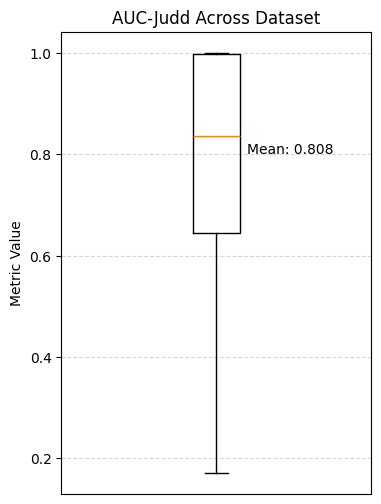

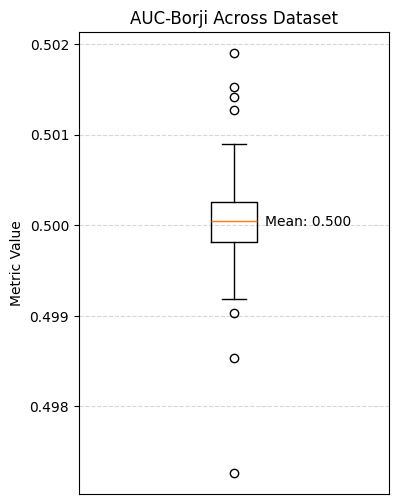

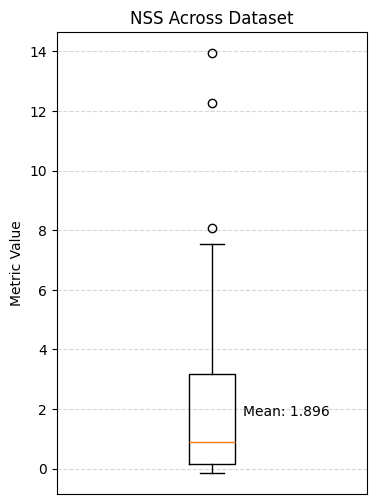

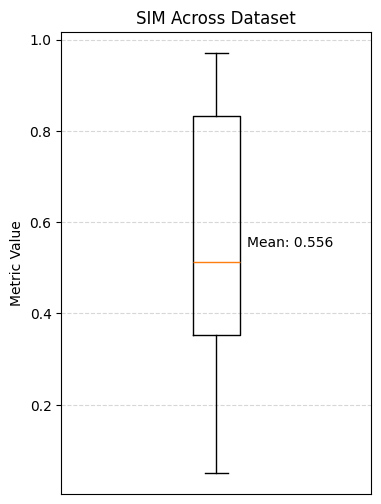

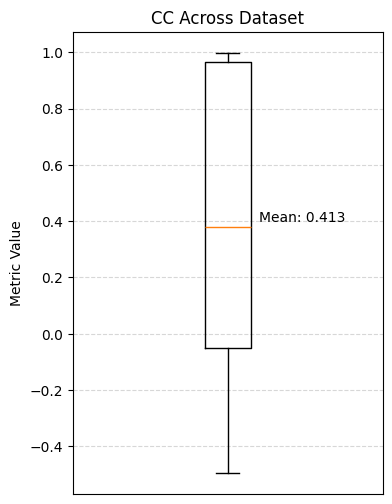

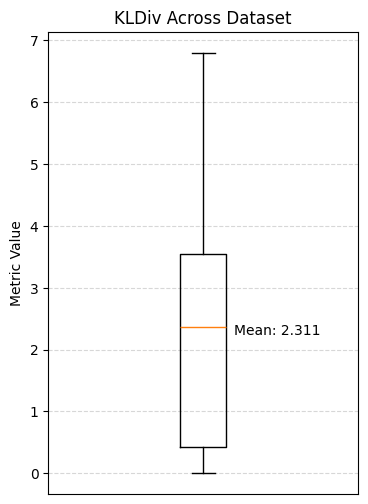

In [ ]:
import os
import timeit
import cv2
import numpy as np
from skimage.color import gray2rgb, rgb2lab
from skimage.io import imread, imsave
from skimage.transform import rescale
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# =========================
# Metric functions
# =========================
def auc_judd(saliency, fixation):
    sal = saliency.flatten()
    fix = fixation.flatten()
    fpr, tpr, _ = roc_curve(fix, sal)
    return auc(fpr, tpr)

def auc_borji(saliency, fixation, n_random=100):
    sal = saliency.flatten()
    fix = fixation.flatten()
    N_fix = fix.sum()
    N_total = len(fix)
    aucs = []
    for _ in range(n_random):
        random_fix = np.zeros_like(fix)
        idx = np.random.choice(N_total, int(N_fix), replace=False)
        random_fix[idx] = 1
        fpr, tpr, _ = roc_curve(random_fix, sal)
        aucs.append(auc(fpr, tpr))
    return np.mean(aucs)

def nss(saliency, fixation):
    S = (saliency - saliency.mean()) / (saliency.std() + 1e-8)
    return S[fixation==1].mean()

def sim(saliency, gt):
    sal = saliency / (saliency.sum() + 1e-8)
    gt = gt / (gt.sum() + 1e-8)
    return np.sum(np.minimum(sal, gt))

def cc(saliency, gt):
    a = saliency - saliency.mean()
    b = gt - gt.mean()
    return np.sum(a*b) / (np.sqrt(np.sum(a*a)*np.sum(b*b)) + 1e-8)

def kldiv(saliency, gt):
    sal = saliency / (saliency.sum() + 1e-8)
    gt = gt / (gt.sum() + 1e-8)
    return np.sum(gt * np.log((gt + 1e-8) / (sal + 1e-8)))

# =========================
# Run Evaluation on Folder
# =========================
folder_path = r"D:\Python_Projects\SpectralResidualSaliency\benchmark_dataset\testSet\Art"
output_folder = os.path.join(folder_path, "Output")
os.makedirs(output_folder, exist_ok=True)

aucj_list, aucb_list, nss_list, sim_list, cc_list, kl_list = [], [], [], [], [], []

for file_name in os.listdir(folder_path):
    if not file_name.lower().endswith(".jpg"):
        continue

    img_path = os.path.join(folder_path, file_name)
    saliency_map = run_saliency(img_path)
    imsave(os.path.join(output_folder, file_name.replace(".jpg","_SaliencyMap.jpg")), saliency_map)

    gt_map = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE) / 255.0
    fixation_map = (gt_map > 0.5).astype(np.uint8)
    
    fixation_map_resized = cv2.resize(fixation_map, (saliency_map.shape[1], saliency_map.shape[0]), interpolation=cv2.INTER_NEAREST)
    gt_resized = cv2.resize(gt_map, (saliency_map.shape[1], saliency_map.shape[0]), interpolation=cv2.INTER_LINEAR)

    sal_density = cv2.GaussianBlur(saliency_map.astype(np.float32)/255, (9,9), 4)
    sal_density /= (sal_density.sum() + 1e-8)
    gt_density = cv2.GaussianBlur(gt_resized, (9,9), 4)
    gt_density /= (gt_density.sum() + 1e-8)

    aucj_list.append(auc_judd(saliency_map/255, fixation_map_resized))
    aucb_list.append(auc_borji(saliency_map/255, fixation_map_resized))
    nss_list.append(nss(saliency_map/255, fixation_map_resized))
    sim_list.append(sim(sal_density, gt_density))
    cc_list.append(cc(sal_density, gt_density))
    kl_list.append(kldiv(sal_density, gt_density))

metrics = {
    'AUC-Judd': aucj_list,
    'AUC-Borji': aucb_list,
    'NSS': nss_list,
    'SIM': sim_list,
    'CC': cc_list,
    'KLDiv': kl_list
}

for name, values in metrics.items():
    plt.figure(figsize=(4,6))
    plt.boxplot(values,showfliers=False)
    mean_val = np.mean(values)
    plt.title(f"{name} Across Dataset")
    plt.ylabel("Metric Value")
    plt.xticks([])
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.text(1.1, mean_val, f"Mean: {mean_val:.3f}", verticalalignment='center', color='Black')
    plt.show()

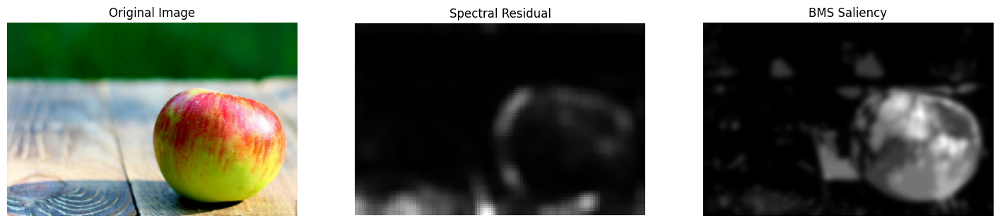

In [6]:
import importlib
import saliency
importlib.reload(saliency)

from saliency import spectral_residual_saliency, compute_bms_saliency, load_rgb_image
import matplotlib.pyplot as plt

img = load_rgb_image('images/apple.jpg')

# Spectral Residual
sr_map = spectral_residual_saliency(img)

# BMS
bms_map = compute_bms_saliency(img)

plt.figure(figsize=(18,6))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(sr_map, cmap='gray')
plt.title("Spectral Residual")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(bms_map, cmap='gray')
plt.title("BMS Saliency")
plt.axis('off')

plt.show()


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

t_min = 0
t_max = 2500000

import tonic

dataset = tonic.datasets.DAVISDATA(save_to="data", recording="shapes_6dof")

data, targets = dataset[0]
events, imu, images = data

img_ts = images["ts"]
img_frames = images["frames"]

img_mask = (img_ts >= t_min) & (img_ts <= t_max)

img_ts_filt = img_ts[img_mask]
img_frames_filt = img_frames[img_mask]

import numpy as np

mean_diff = np.diff(list(zip(images["ts"], images["ts"][1:]))).mean()
print(f"Average difference in image timestamps in microseconds: {mean_diff}")

  0%|          | 0/321575849 [00:00<?, ?it/s]

Average difference in image timestamps in microseconds: 44065.366051660516


In [20]:
mean_diff= mean_diff*10

In [21]:
import torch
import torchvision

sensor_size = tonic.datasets.DAVISDATA.sensor_size
frame_transform = tonic.transforms.ToFrame(
    sensor_size=sensor_size, time_window=mean_diff
)

image_center_crop = torchvision.transforms.Compose(
    [torch.tensor, torchvision.transforms.CenterCrop((100, 100))]
)


def data_transform(data):
    # first we have to unpack our data
    events, imu, images = data
    # we bin events to event frames
    frames = frame_transform(events)
    # then we can apply frame transforms to both event frames and images at the same time
    frames_cropped = image_center_crop(frames)
    images_cropped = image_center_crop(images["frames"])
    return frames_cropped, imu, images_cropped

dataset = tonic.datasets.DAVISDATA(
    save_to="./data", recording="shapes_6dof", transform=data_transform
)

data, targets = dataset[0]
frames_cropped, imu, images_cropped = data

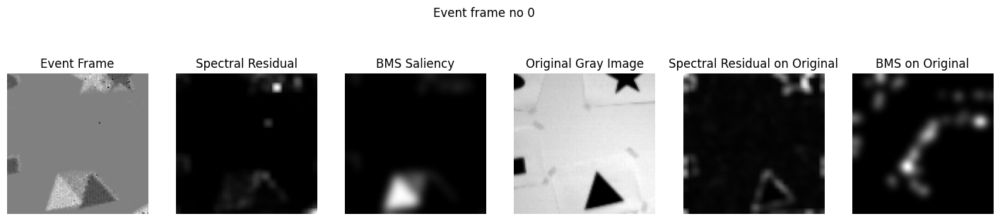

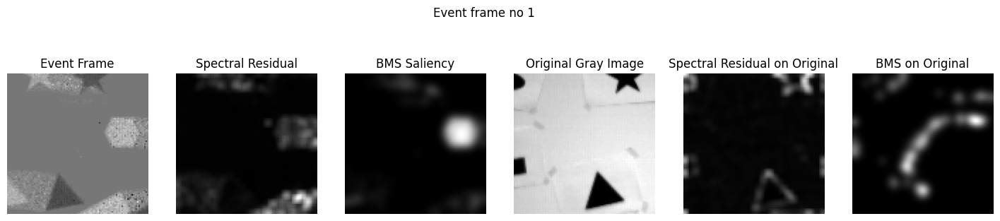

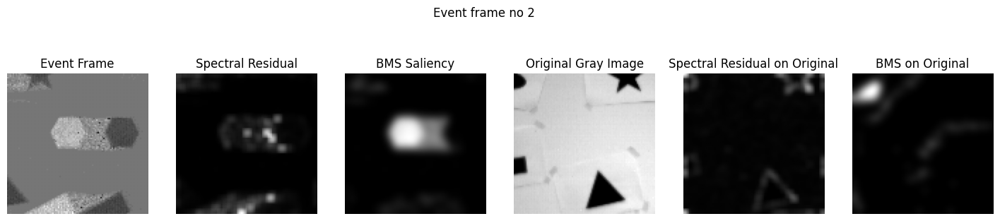

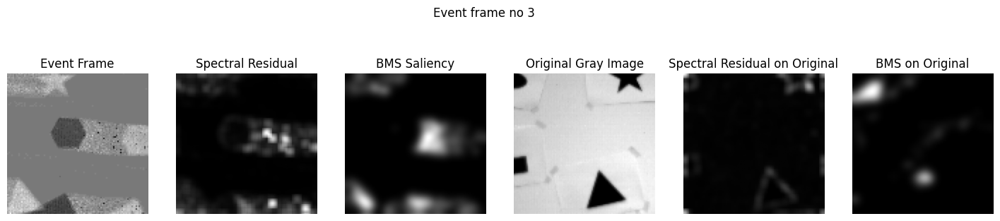

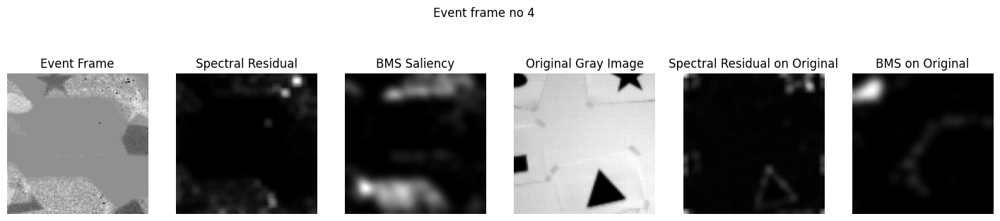

...

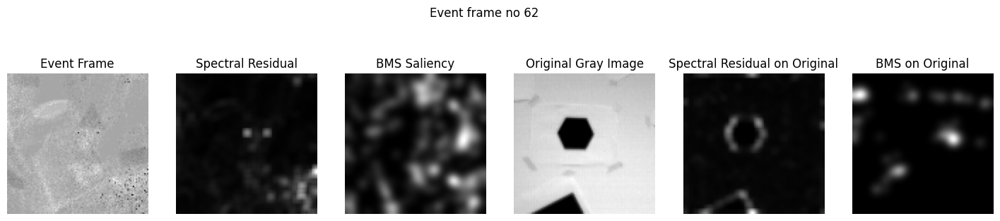

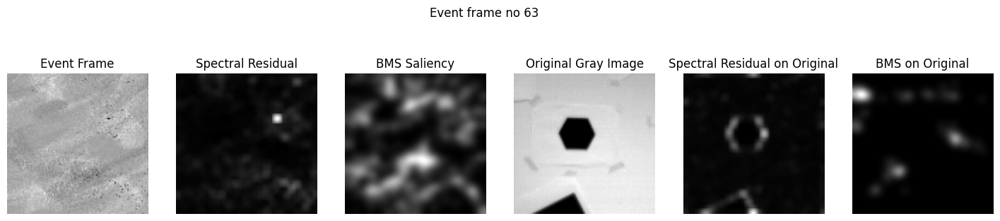

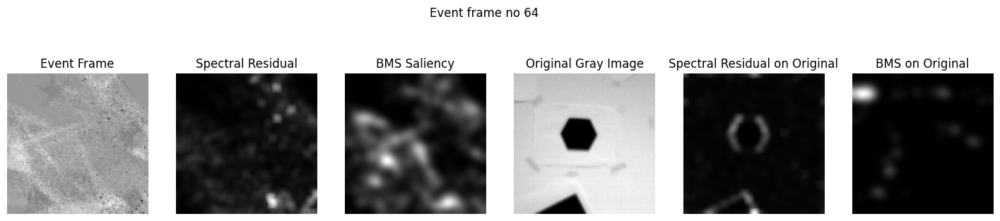

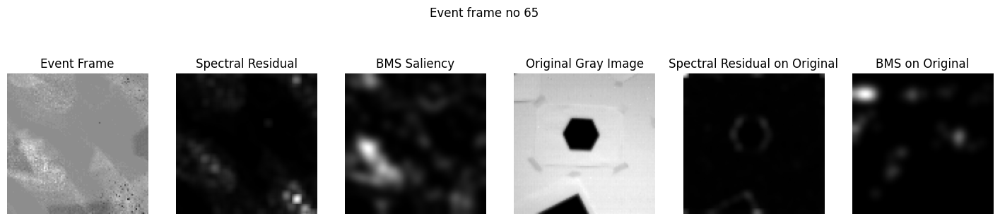

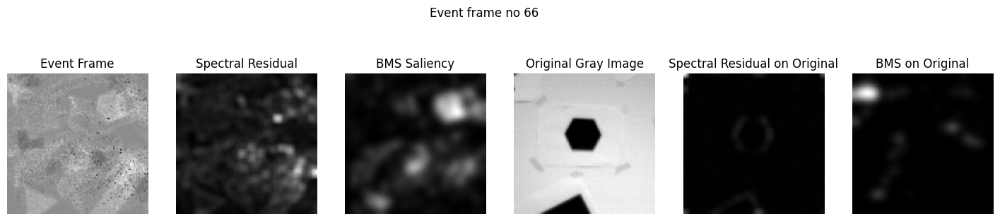

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import torch
import torchvision
import tonic
from saliency import spectral_residual_saliency, compute_bms_saliency 

nth = np.arange(0, len(frames_cropped))

for n in nth:
    # ------------------------
    # Event frame (2 kênh) -> grayscale
    # ------------------------
    event_frame = frames_cropped[n]  # shape: [2, H, W]
    ev_gray = (event_frame[0] - event_frame[1]).numpy()
    ev_gray = (ev_gray - ev_gray.min()) / (ev_gray.max() - ev_gray.min() + 1e-8)  # normalize 0-1
    ev_gray_255 = (ev_gray * 255).astype(np.uint8)
    ev_rgb = np.stack([ev_gray_255]*3, axis=-1)  # 3 kênh RGB cho BMS

    # Saliency trên event frame
    sr_map = spectral_residual_saliency(ev_rgb)
    bms_map = compute_bms_saliency(ev_rgb)

    # ------------------------
    # Original gray image -> uint8 RGB
    # ------------------------
    img_orig = images_cropped[n]
    if isinstance(img_orig, torch.Tensor):
        img_orig = img_orig.numpy()
    if img_orig.max() <= 1.0:  # normalize 0-1 -> 0-255
        img_orig = (img_orig * 255).astype(np.uint8)
    if img_orig.ndim == 2:  # grayscale -> RGB
        img_orig_rgb = np.stack([img_orig]*3, axis=-1)
    else:
        img_orig_rgb = img_orig

    # Saliency trên ảnh gốc
    sr_map_origin = spectral_residual_saliency(img_orig_rgb)
    bms_map_origin = compute_bms_saliency(img_orig_rgb)

    # ------------------------
    # Hiển thị
    # ------------------------
    fig, axes = plt.subplots(1, 6, figsize=(18,4))
    fig.suptitle(f"Event frame no {n}")

    axes[0].imshow(ev_gray, cmap=mpl.cm.gray)
    axes[0].set_title("Event Frame")
    axes[0].axis('off')

    axes[1].imshow(sr_map, cmap=mpl.cm.gray)
    axes[1].set_title("Spectral Residual")
    axes[1].axis('off')

    axes[2].imshow(bms_map, cmap=mpl.cm.gray)
    axes[2].set_title("BMS Saliency")
    axes[2].axis('off')

    axes[3].imshow(img_orig, cmap=mpl.cm.gray)
    axes[3].set_title("Original Gray Image")
    axes[3].axis('off')

    axes[4].imshow(sr_map_origin, cmap=mpl.cm.gray)
    axes[4].set_title("Spectral Residual on Original")
    axes[4].axis('off')

    axes[5].imshow(bms_map_origin, cmap=mpl.cm.gray)
    axes[5].set_title("BMS on Original")
    axes[5].axis('off')

    plt.show()
